In [1]:
import numpy as np
from scipy import stats
from scipy.signal import boxcar,convolve,correlate,resample,argrelextrema
from scipy.cluster.vq import kmeans,kmeans2
import random
import djd.generalephys as ephys
import cPickle as pkl
import pandas as pd
import h5py

import os, sys,glob, copy

import matplotlib.pyplot as plt
import matplotlib.patches as patches
from matplotlib.colors import Normalize
from djd.generalephys import placeAxesOnGrid
import seaborn as sns
sns.set_style("ticks")

%matplotlib inline

%load_ext autoreload
%autoreload 2
import warnings
warnings.filterwarnings('ignore')

/Users/administrator/anaconda/lib/python2.7/site-packages/imaging_behavior/core/tifffile.py:2170: UserWarning: failed to import _tifffile.decodepackbits
  warnings.warn("failed to import %s" % module_function)
/Users/administrator/anaconda/lib/python2.7/site-packages/imaging_behavior/core/tifffile.py:2170: UserWarning: failed to import _tifffile.decodelzw
  warnings.warn("failed to import %s" % module_function)
/Users/administrator/anaconda/lib/python2.7/site-packages/imaging_behavior/core/tifffile.py:2170: UserWarning: failed to import _tifffile.unpackints
  warnings.warn("failed to import %s" % module_function)


In [2]:
def raster_singletrial(nwb_data,trigger,pre=0.5,timeDomain=True,post=1,insertion_angle=45,yoffset=0,output='fig',name='',color='#00cc00',linewidth=0.5,axes=None,labels=True,sparse=False,labelsize=18,axis_labelsize=20,error='',alpha=0.5,**kwargs):
	post = post + 1
	if timeDomain:
		samplingRate = 1.0
	else:
		samplingRate = samplingRate
        
	t = float(trigger) / samplingRate
	bycell = [];
	
	if axes == None:
		plt.figure()
		axes=plt.gca()
		
	for i,cell in enumerate(np.sort(nwb_data['processing'][probe]['UnitTimes'].keys())[:-1]):
		times = nwb_data['processing'][probe]['UnitTimes'][cell]['times']
		if len(np.where(times >= t - pre)[0]) > 0 and len(np.where(times >= t + post)[0]) > 0:
			start = np.where(times >= t - pre)[0][0]
			end = np.where(times >= t + post)[0][0]
			bycell.append(np.array(times[start:end-1])-t)
			axes.plot(np.array(times[start:end-1])-t,np.ones(len(np.array(times[start:end-1])-t))*(nwb_data['processing'][probe]['UnitTimes'][cell]['ypos']*np.sin(np.deg2rad(90-insertion_angle))),'|',
                      linewidth=1,mew=0.5,
                      #color='#d9d9d9')
                      color=ephys.color50[i%50])
	axes.set_xlim(-pre,post)
	axes.set_title(name)
	
	if sparse:
		cleanAxes(axes,total=True)
	else:
		if labels:
			axes.set_xlabel(r'$time \/ [s]$',fontsize=16)
			axes.set_ylabel(r'$depth \/ um$',fontsize=16)
			axes.tick_params(axis='both',labelsize=labelsize)
			axes.spines['top'].set_visible(False);axes.yaxis.set_ticks_position('left')
			axes.spines['right'].set_visible(False);axes.xaxis.set_ticks_position('bottom')
	if output == 'fig':
		return (plt.gcf(),plt.gca())
	if output=='data':
		return bycell
        

In [3]:
exptpath='/Volumes/DATA2/temporal/M310008/M310008_2017-04-11_08-23-22'
filename = 'M310008_08-23-22_v1_angled.nwb'
nwb_data = h5py.File(os.path.join(exptpath,filename))
probe = 'V1'

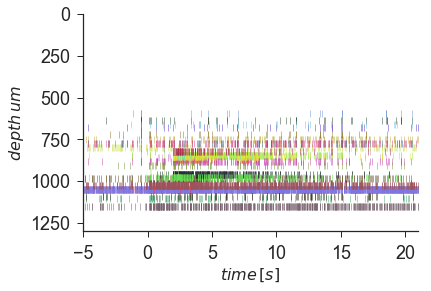

In [7]:
if 'binary_green' in nwb_data['stimulus']['presentation'].keys():
    raster_singletrial(nwb_data,np.array(nwb_data['stimulus']['presentation']['binary_green']['timestamps'])[0],pre=5,post=20)
    plt.gca().set_ylim(1300,0)

In [8]:
if 'binary' in nwb_data['stimulus']['presentation'].keys():
    raster_singletrial(nwb_data,np.array(nwb_data['stimulus']['presentation']['binary']['timestamps'])[0],pre=2,post=10)
    plt.gca().set_ylim(1200,0)

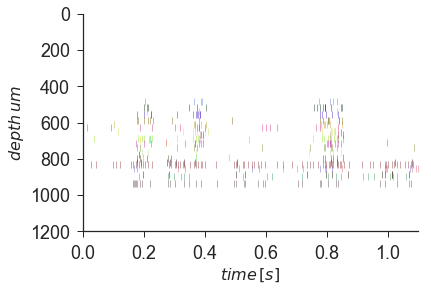

In [9]:
if 'natural_scenes' in nwb_data['stimulus']['presentation'].keys():
    raster_singletrial(nwb_data,np.array(nwb_data['stimulus']['presentation']['natural_scenes']['timestamps'])[0],
                        insertion_angle=55,
                       pre=0,post=.1)
    plt.gca().set_ylim(1200,0)

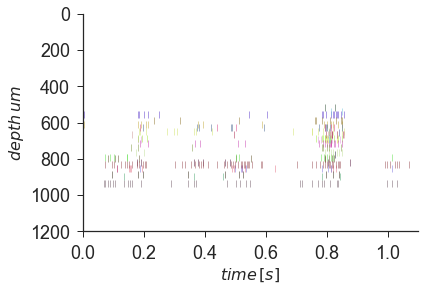

In [10]:
if 'natural_scenes' in nwb_data['stimulus']['presentation'].keys():
    raster_singletrial(nwb_data,np.array(nwb_data['stimulus']['presentation']['natural_scenes']['timestamps'])[118],
                        insertion_angle=55,
                       pre=0,post=.1)
    plt.gca().set_ylim(1200,0)

In [11]:
nspikes = [len(nwb_data['processing'][probe]['UnitTimes'][unit]['times'])for unit in np.array(nwb_data['processing'][probe]['UnitTimes']['unit_list'])]
ypos = [nwb_data['processing'][probe]['UnitTimes'][unit]['ypos'] for unit in np.array(nwb_data['processing'][probe]['UnitTimes']['unit_list'])]
sorted_by_total_spikes = [x for (y,x) in sorted(zip(nspikes,np.array(nwb_data['processing'][probe]['UnitTimes']['unit_list'])))] 
sorted_by_ypos = [x for (y,x) in sorted(zip(ypos,np.array(nwb_data['processing'][probe]['UnitTimes']['unit_list'])))] 
totals = [y for (y,x) in sorted(zip(nspikes,np.array(nwb_data['processing'][probe]['UnitTimes']['unit_list'])))] 
ypositions = [y for (y,x) in sorted(zip(ypos,np.array(nwb_data['processing'][probe]['UnitTimes']['unit_list'])))] 

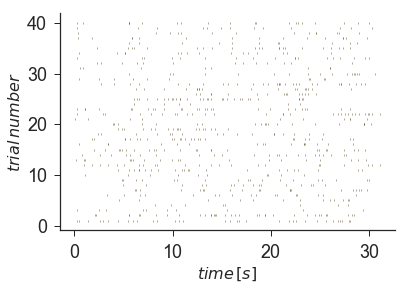

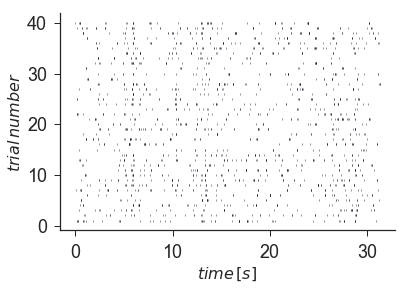

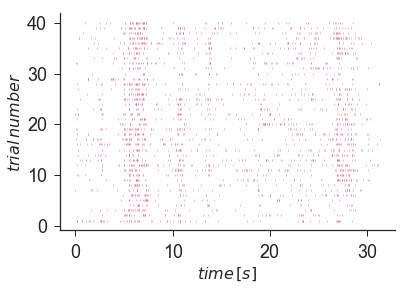

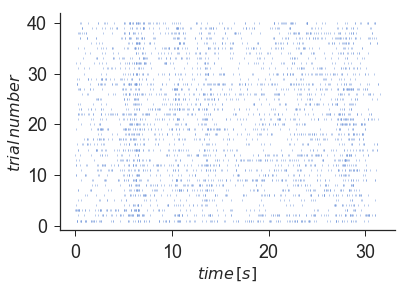

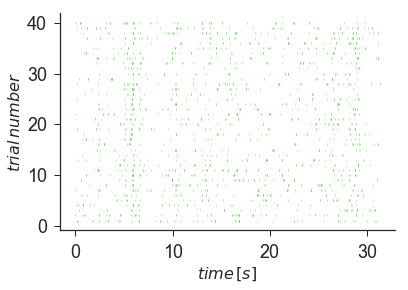

...

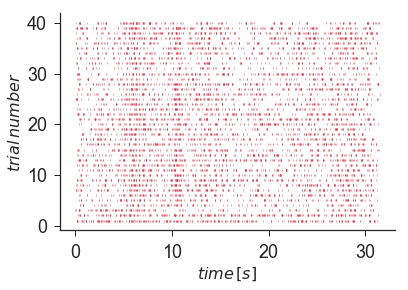

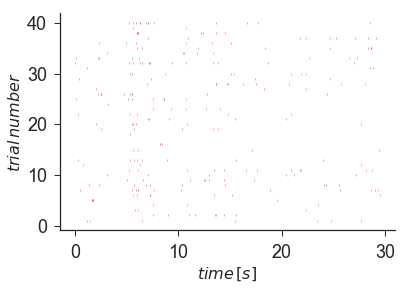

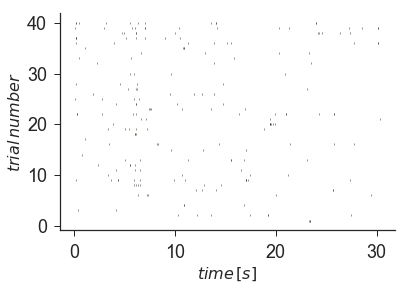

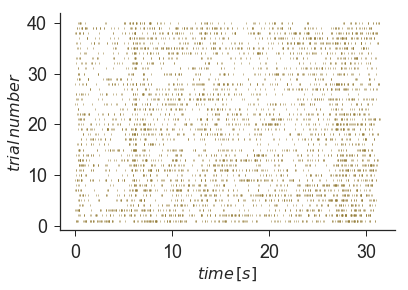

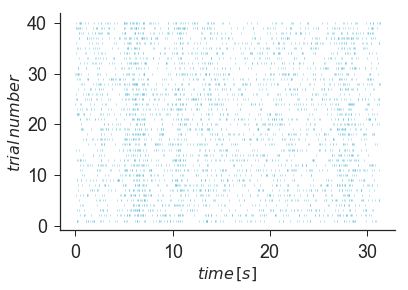

In [13]:
if 'natural movie: TOE1' in nwb_data['stimulus']['presentation'].keys():
    for i,u in enumerate(sorted_by_ypos):
        ephys.raster(np.array(nwb_data['processing'][probe]['UnitTimes'][u]['times']),
                    np.array(nwb_data['stimulus']['presentation']['natural movie: TOE1']['timestamps'][::900]),
                    pre=0.0,post=30.5,
                    timeDomain=True,
                    color=ephys.color50[i%50],
                    title=u,
                    )

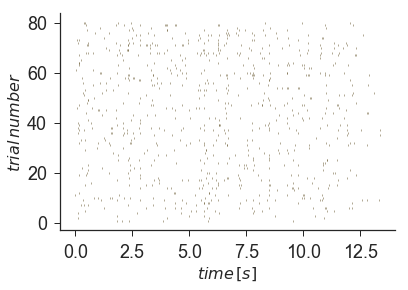

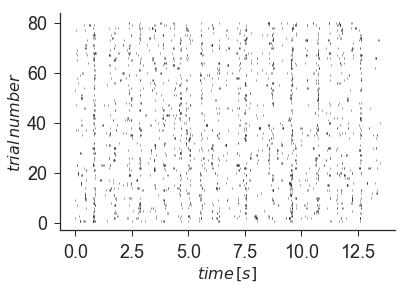

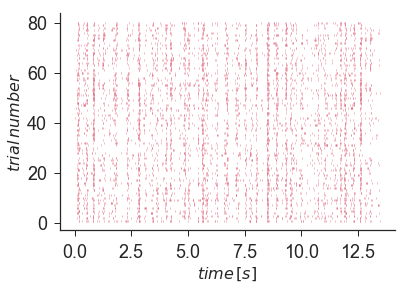

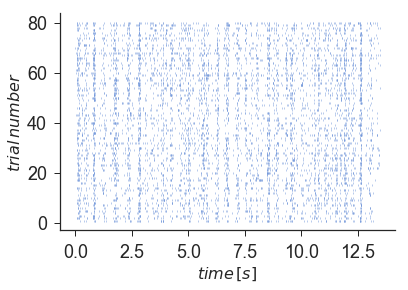

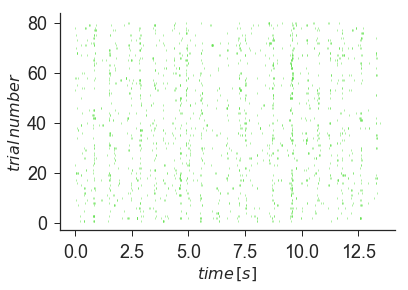

...

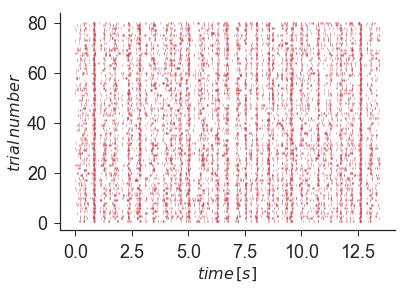

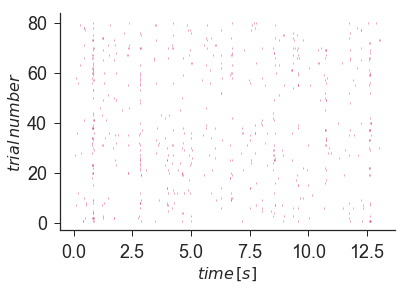

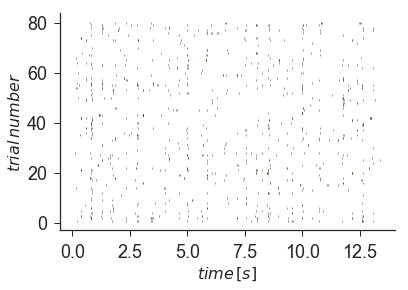

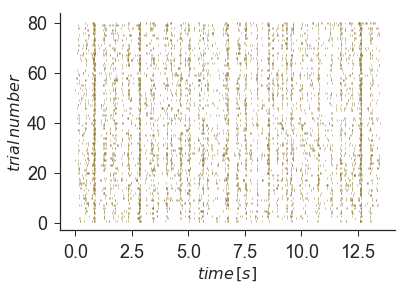

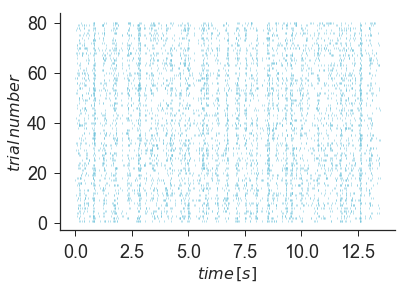

In [12]:
if 'natural_scenes' in nwb_data['stimulus']['presentation'].keys():
    for i,u in enumerate(sorted_by_ypos):
        ephys.raster(np.array(nwb_data['processing'][probe]['UnitTimes'][u]['times']),
                    np.array(nwb_data['stimulus']['presentation']['natural_scenes']['timestamps'][::118]),
                    pre=0.0,post=12.5,
                    timeDomain=True,
                    color=ephys.color50[i%50],
                    title=u,
                    )

In [11]:
if 'flicker' in nwb_data['stimulus']['presentation'].keys():
    for i,u in enumerate(sorted_by_ypos):
        ephys.raster(np.array(nwb_data['processing'][probe]['UnitTimes'][u]['times']),
                    np.array(nwb_data['stimulus']['presentation']['flicker']['timestamps'][::20*12]),
                    pre=0.0,post=12.5,
                    timeDomain=True,
                    color=ephys.color50[i%50],
                    title=u,
                    )

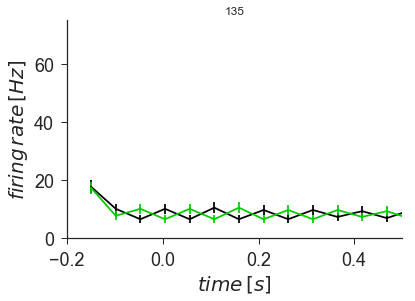

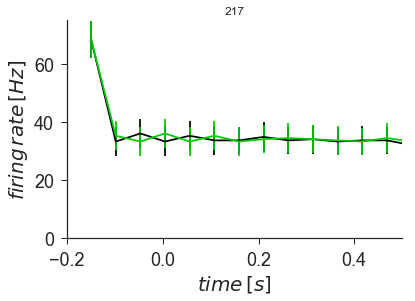

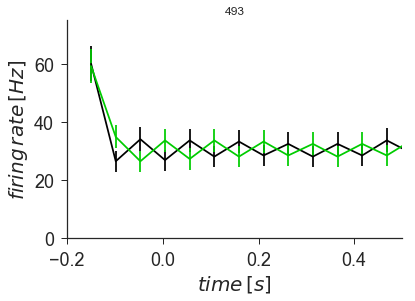

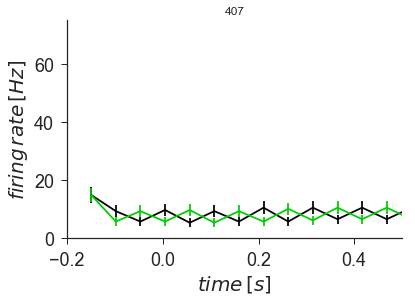

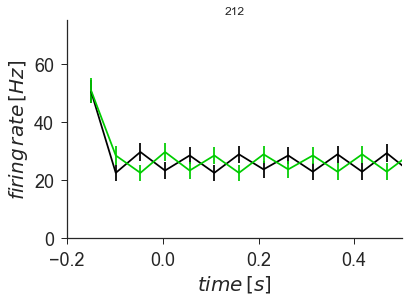

...

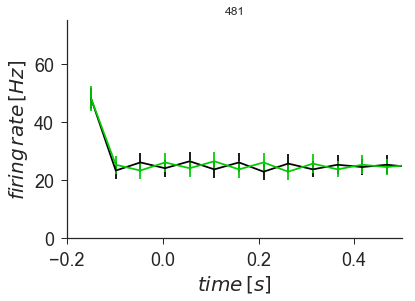

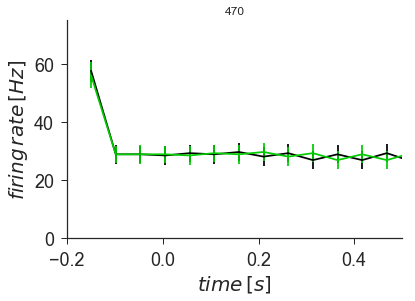

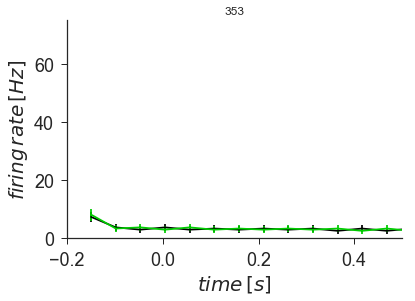

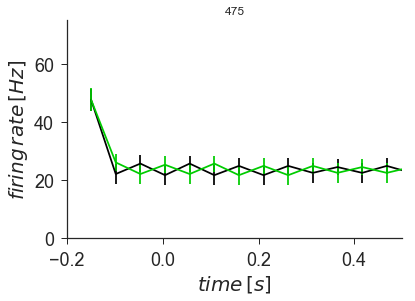

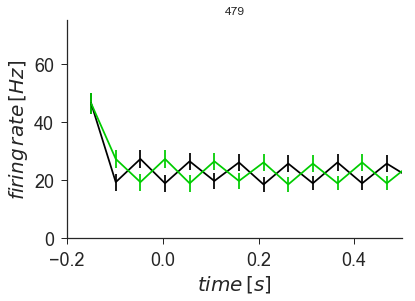

In [12]:
if 'full field flashes' in nwb_data['stimulus']['presentation'].keys():
    for u in sorted_by_ypos:
        f,ax = plt.subplots(1)
        ephys.psth_line(np.array(nwb_data['processing'][probe]['UnitTimes'][u]['times']),
                np.array(nwb_data['stimulus']['presentation']['full field flashes']['timestamps'][1::2]),
                pre=0.2,post=.5,
                timeDomain=True,
                color='k',
                axes=ax,
                )
        ephys.psth_line(np.array(nwb_data['processing'][probe]['UnitTimes'][u]['times']),
                np.array(nwb_data['stimulus']['presentation']['full field flashes']['timestamps'][::2]),
                pre=0.2,post=.5,
                timeDomain=True,
                axes=ax,
                )
        ax.set_title(u)

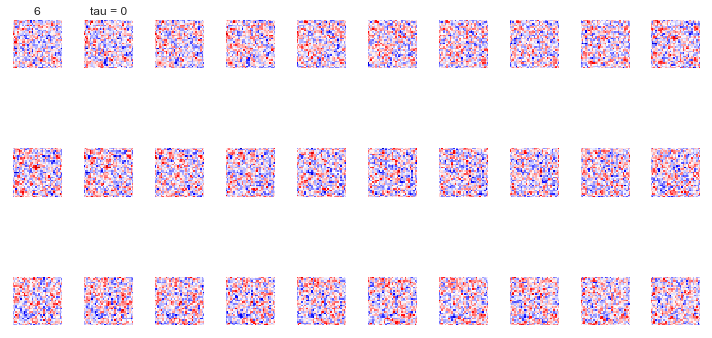

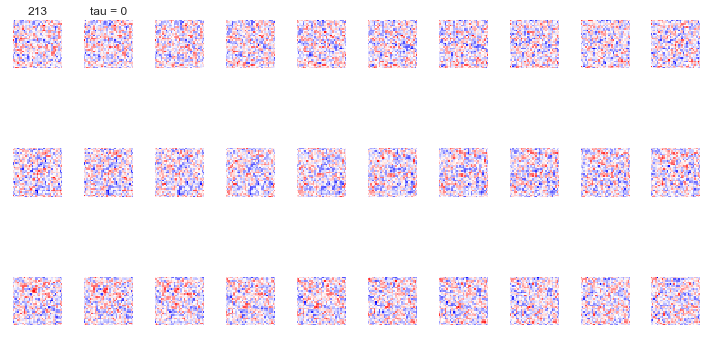

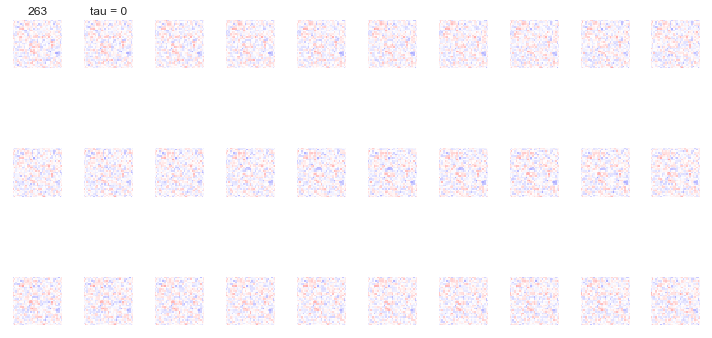

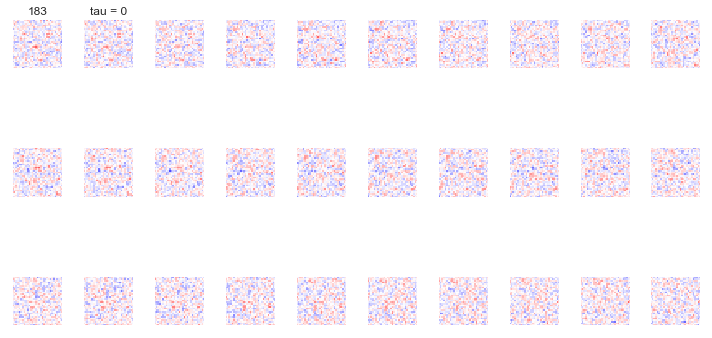

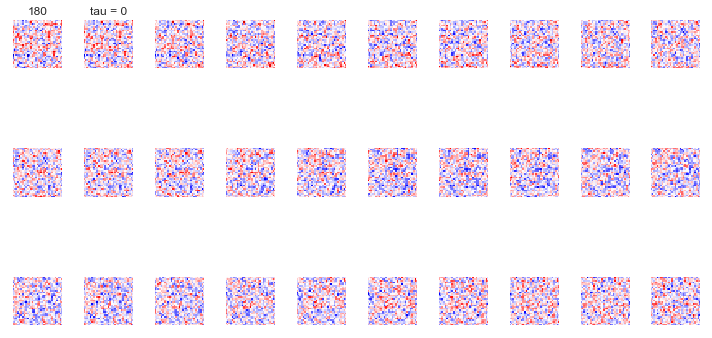

...

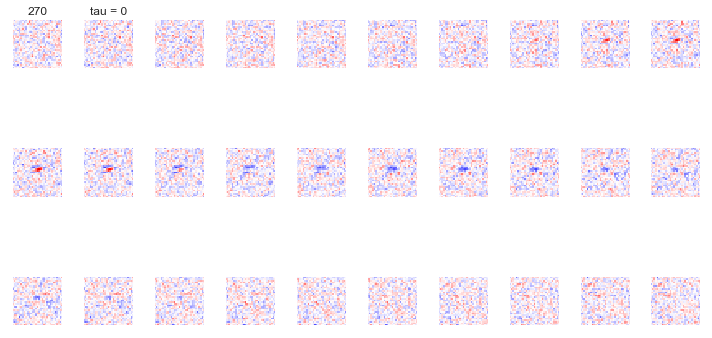

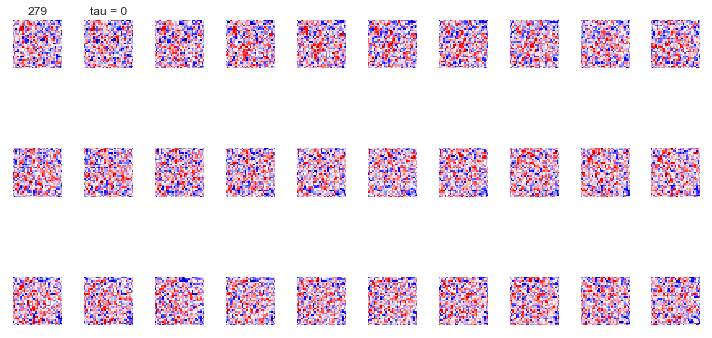

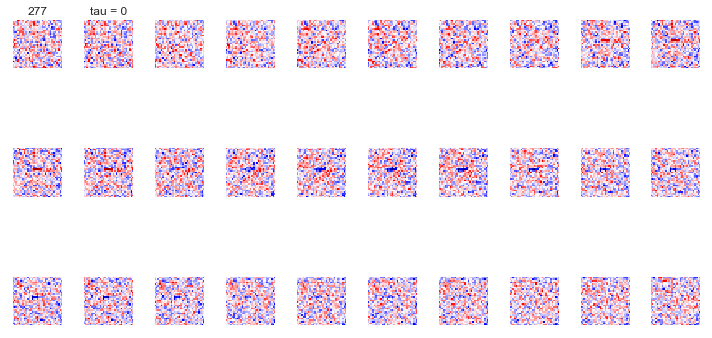

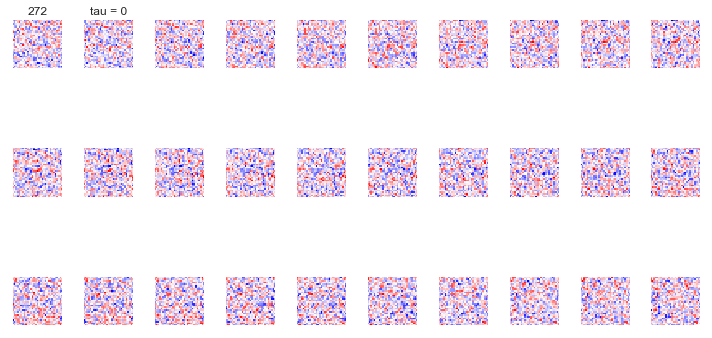

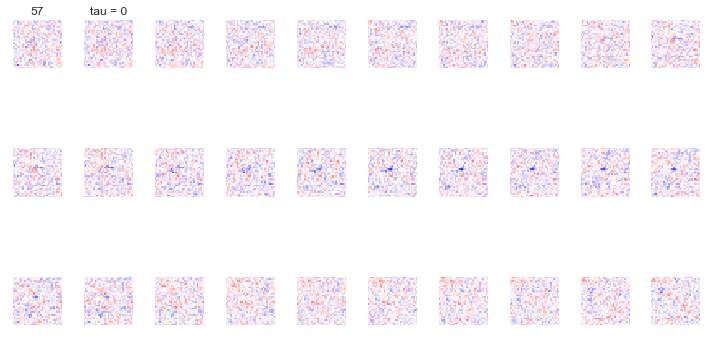

In [14]:
stas_g = {}
for u in sorted_by_ypos:
    stas_g[u]= ephys.sta_with_subfields(np.array(nwb_data['processing'][probe]['UnitTimes'][u]['times']),
                                                    np.array(nwb_data['stimulus']['presentation']['binary_green']['data']).T.astype(float),
                                                    np.array(nwb_data['stimulus']['presentation']['binary_green']['timestamps']),
                                                    taus=(np.arange(-10,290,10)),
                                                     samplingRateInkHz = .001)
    ephys.plotsta(stas_g[u][0],smooth=0.5,taus=(np.arange(-10,290,10)),nrows=3,title=u,window = [[20,50],[20,50]])#,taus=(np.arange(-280,10,10)))

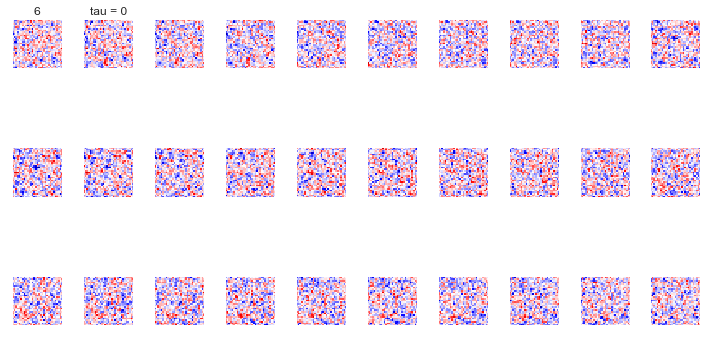

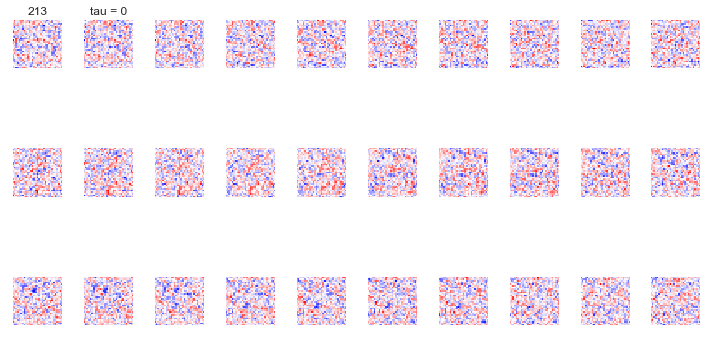

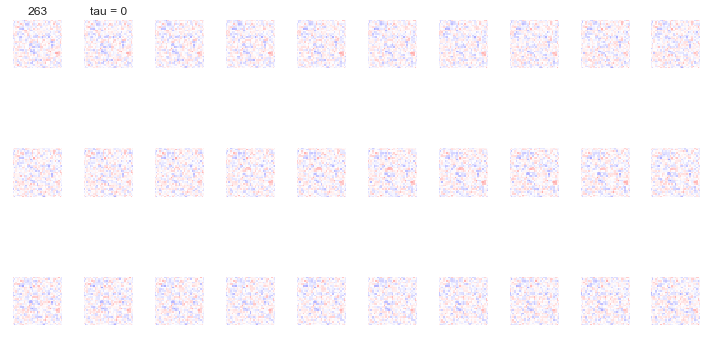

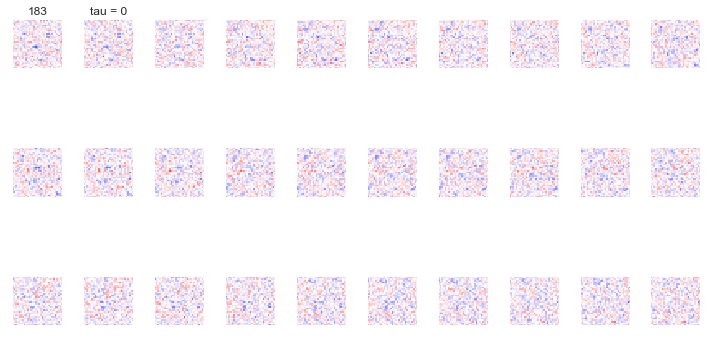

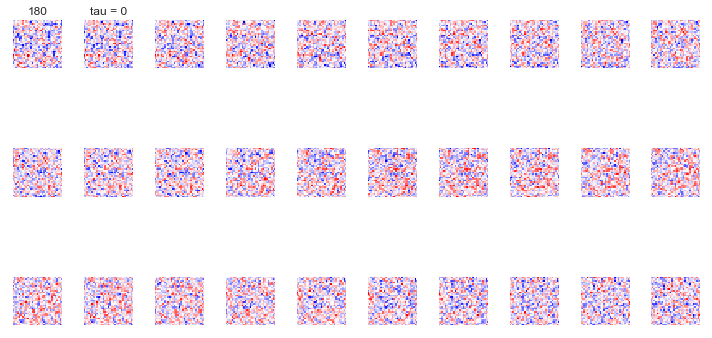

...

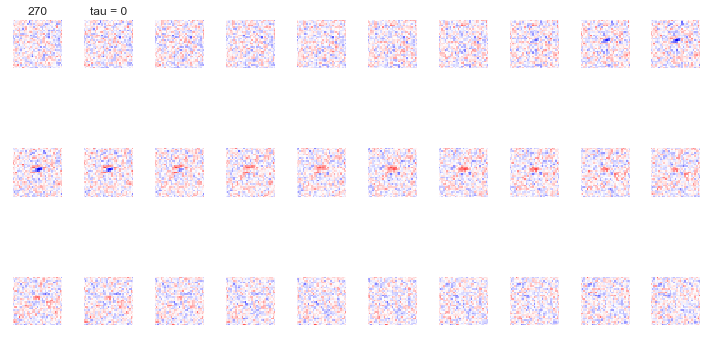

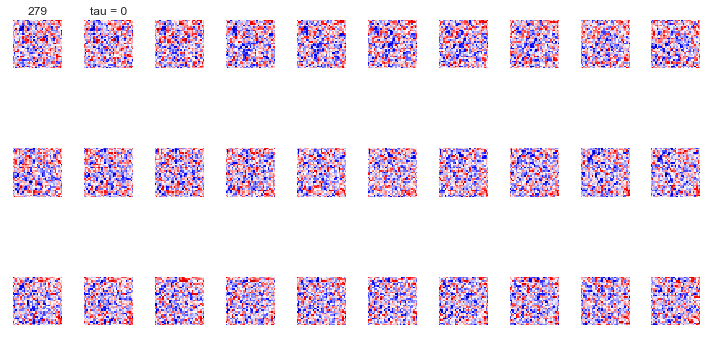

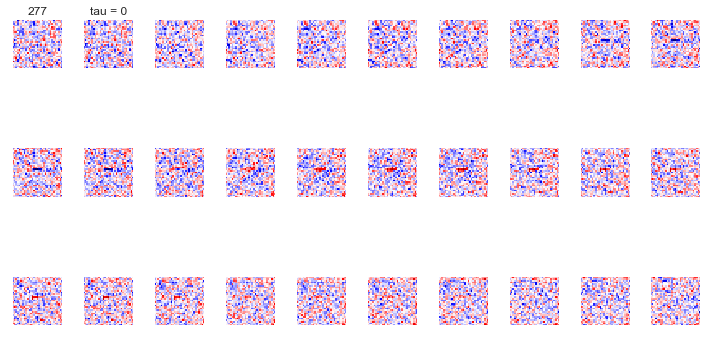

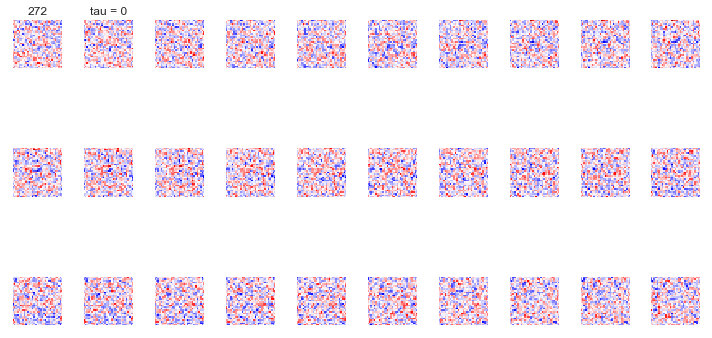

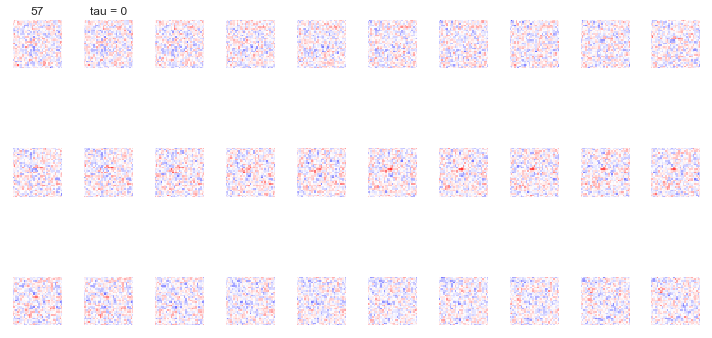

In [15]:
stas_b = {}
for u in sorted_by_ypos:
    stas_b[u]= ephys.sta_with_subfields(np.array(nwb_data['processing'][probe]['UnitTimes'][u]['times']),
                                                    np.array(nwb_data['stimulus']['presentation']['binary_UV']['data']).T.astype(float),
                                                    np.array(nwb_data['stimulus']['presentation']['binary_UV']['timestamps']),
                                                    taus=(np.arange(-10,290,10)),
                                                     samplingRateInkHz = .001)
    ephys.plotsta(stas_b[u][0],smooth=0.5,taus=(np.arange(-10,290,10)),nrows=3,title=u,window = [[20,50],[20,50]])#,taus=(np.arange(-280,10,10)))

In [ ]:
stas_lum = {}
for u in sorted_by_ypos:
    stas_lum[u]= ephys.sta_with_subfields(np.array(nwb_data['processing'][probe]['UnitTimes'][u]['times']),
                                                    (np.array(nwb_data['stimulus']['presentation']['binary']['data']).T.astype(float)-128)/127.,
                                                    np.array(nwb_data['stimulus']['presentation']['binary']['timestamps']),
                                                    taus=(np.arange(-10,290,10)),
                                                     samplingRateInkHz = .001)
    ephys.plotsta(stas_lum[u][0],smooth=0.5,taus=(np.arange(-10,290,10)),nrows=3,title=u,window = [[25,45],[20,40]],colorrange=(100,156))#,taus=(np.arange(-280,10,10)))

In [16]:
pkl.dump(stas_g,open(os.path.join(exptpath,'stas_g.pkl'),'wb'))
pkl.dump(stas_b,open(os.path.join(exptpath,'stas_b.pkl'),'wb'))
#pkl.dump(stas_lum,open(os.path.join(exptpath,'stas_lum.pkl'),'wb'))